In [108]:
from polygon import RESTClient
import local_settings as settings #api key file
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px
import numpy as np
import requests
import json
import time
import os
import glob
import seaborn as sn
from matplotlib.pyplot import figure
from plotly.subplots import make_subplots
from datetime import date

api_key = settings.polygon['api_key']
client = RESTClient(api_key)
client

In [109]:
# Standalone for pair and chart
date_start = '2023-01-16' #only goes back to 2 years
date_end = '2024-01-18' #only provides end of prev. day 
coin = 'AAVEUSD'
multiplier = '1'
timespan = 'minute'

date_spans = {}
latest_added = date_start
bdf = pd.DataFrame()

while date_start not in date_spans:
    date_spans[date_start] = 0
    url = f'https://api.polygon.io/v2/aggs/ticker/X:{coin}/range/{multiplier}/{timespan}/{date_start}/{date_end}?limit=50000&apiKey={api_key}'
    response = requests.get(url)

    if response.status_code == 200:  # check to make sure the response from server is good
            df = pd.DataFrame(json.loads(response.text)['results'])
            df.rename(columns = {'v':'Volume','vw':'Volume Weighted','o':'Open','c':'Close','h':'High','l':'Low','t':'Time'}, inplace = True)
            df['Time'] = pd.to_datetime(df['Time'],unit='ms')
            bdf = pd.concat([bdf, df], ignore_index=True)

            if df is None:
                print("Did not return any data from polygon.io for this symbol")
            # else: #ONLY UNCOMMENT FOR SAVING CSVs !!!!!!!!!!!!!!!!!!!!!!!
            #     df.to_csv(f'{coin}_{str(df.iloc[0,6])[0:10]}_to_{str(df.iloc[-1,6])[0:10]}_{multiplier}{timespan[0]}_data.csv', index=False)
    else:
        print("Did not receieve OK response from polygon.io API")

    latest_added = str(bdf.iloc[-1,6])[0:10]
    date_start = latest_added
    # time.sleep(13) # ONLY 5 calls/min

bdf.drop_duplicates(keep="first", inplace=True)
t1 = bdf.iloc[0,6]
t2 = bdf.iloc[-1,6]
print(f'Pair:{coin}\tStart:\t{t1}\tEnd:\t{t2}\tShape:\t{bdf.shape}')
# bdf.to_csv( f'/Users/csingh/Documents/Projects/Quant/polygonIO/1m_data/{coin}_{str(bdf.iloc[0,6])[0:10]}_to_{str(bdf.iloc[-1,6])[0:10]}_{multiplier}{timespan[0]}_data.csv', index=False)
sdf = bdf
fig = go.Figure(data=[go.Candlestick(x=sdf.Time,open=sdf.Open, high=sdf.High,low=sdf.Low, close=sdf.Close, name=coin)])

fig.update_layout(
                title={'text' : coin +' '+ str(multiplier)+ timespan[0:2] +" from " + str(sdf.iloc[0,6])[0:10] + ' to ' + str(sdf.iloc[-1,6])[0:10],'y':0.92,'x':0.5,'xanchor': 'center','yanchor': 'top'},
                xaxis_title="Time",yaxis_title= coin + '/USD', yaxis={'side': 'right'} ,xaxis = {'rangeslider': {'visible': False}},
                width = 800,height = 500)
fig.show()

Pair:AAVEUSD	Start:	2023-01-16 00:00:00	End:	2023-01-18 23:58:00	Shape:	(4289, 8)


In [38]:
# Function for iterating pairs data
def coin_data(pair, ds, de = '2025-01-15', multiplier = '1', timespan = 'minute'): 
    #Data Gathering and csv creator for pair
    date_start = ds #only goes back to 2 years, but this works for getting earliest
    date_end = de
    coin = pair
    date_spans = {}
    latest_added = date_start
    bdf = pd.DataFrame()

    while date_start not in date_spans:

        date_spans[date_start] = 0
        url = f'https://api.polygon.io/v2/aggs/ticker/X:{coin}/range/{multiplier}/{timespan}/{date_start}/{date_end}?limit=50000&apiKey={api_key}'
        response = requests.get(url)

        if response.status_code == 200:  # check to make sure the response from server is good
                df = pd.DataFrame(json.loads(response.text)['results'])
                df.rename(columns = {'v':'Volume','vw':'Volume Weighted','o':'Open','c':'Close','h':'High','l':'Low','t':'Time'}, inplace = True)
                df['Time'] = pd.to_datetime(df['Time'],unit='ms')

                bdf = pd.concat([bdf, df], ignore_index=True)

                if df is None:
                    print("Did not return any data from polygon.io for this symbol")
        else:
            print("Did not receieve OK response from polygon.io API")

        latest_added = str(bdf.loc[bdf.index[-1],'Time'])[0:10]
        date_start = latest_added
        # print(f'End of df: [{latest_added}], Next Start:{date_start}, Next End:{date_end}')
        # print('------------------------------------')
        time.sleep(13) # ONLY 5 calls/min

    bdf.drop_duplicates(keep="first", inplace=True)
    t1 = bdf.loc[bdf.index[0],'Time']
    t2 = bdf.loc[bdf.index[-1],'Time']
    print(f'Pair:{coin}\tStart:\t{t1}\tEnd:\t{t2}\tShape:\t{bdf.shape}')
    # bdf.to_csv( f'/Users/csingh/Documents/Projects/Quant/polygonIO/1m_data/{coin}_{str(bdf.iloc[0,6])[0:10]}_to_{str(bdf.iloc[-1,6])[0:10]}_{multiplier}{timespan[0]}_data.csv', index=False)
    return bdf
    

In [152]:
# Obtaining OHLC data for each pair and saving as CSV file
pairs = ['AAVEUSD','ATOMUSD','BTCUSD','COMPUSD','DOTUSD','ETHUSD','LINKUSD','LTCUSD','MANAUSD','UNIUSD','SNXUSD','XRPUSD','YFIUSD','ZECUSD']
pairs_df = []
for pair in pairs:
    sdf = coin_data(pair,ds='2021-01-17',multiplier=30)
    pairs_df.append(sdf)

Pair:AAVEUSD	Start:	2021-01-17 00:00:00	End:	2023-01-15 23:30:00	Shape:	(34992, 8)
Pair:ATOMUSD	Start:	2021-01-17 00:00:00	End:	2023-01-15 23:30:00	Shape:	(34944, 8)
Pair:BTCUSD	Start:	2021-01-17 00:00:00	End:	2023-01-15 23:30:00	Shape:	(34992, 8)
Pair:COMPUSD	Start:	2021-01-17 00:00:00	End:	2023-01-16 23:30:00	Shape:	(35039, 8)
Pair:DOTUSD	Start:	2021-01-17 00:03:00	End:	2023-01-16 23:30:00	Shape:	(35039, 8)
Pair:ETHUSD	Start:	2021-01-17 00:08:00	End:	2023-01-16 23:30:00	Shape:	(35045, 8)
Pair:LINKUSD	Start:	2021-01-17 00:14:00	End:	2023-01-16 23:30:00	Shape:	(35063, 8)
Pair:LTCUSD	Start:	2021-01-17 00:19:00	End:	2023-01-16 23:30:00	Shape:	(34980, 8)
Pair:MANAUSD	Start:	2021-01-17 00:25:00	End:	2023-01-16 23:30:00	Shape:	(34979, 8)
Pair:UNIUSD	Start:	2021-01-17 00:30:00	End:	2023-01-16 23:30:00	Shape:	(34799, 8)
Pair:SNXUSD	Start:	2021-01-17 00:35:00	End:	2023-01-16 23:30:00	Shape:	(34839, 8)
Pair:XRPUSD	Start:	2021-01-17 00:40:00	End:	2023-01-16 23:30:00	Shape:	(34834, 8)
Pair:YFIUSD

In [76]:
# Reloading CSVs from different folder 
pairs = ['AAVEUSD','ATOMUSD','BTCUSD','COMPUSD','DOTUSD','ETHUSD','LINKUSD','LTCUSD','MANAUSD','UNIUSD','SNXUSD','XRPUSD','YFIUSD','ZECUSD']
dir_name = "1m_data"
pairs_df = []
for file in np.sort(os.listdir(dir_name)):
    if '.csv' in file:
        df = pd.DataFrame(pd.read_csv(f'{dir_name}/{file}',header=0))
        pairs_df.append(df)
        print(f'{file} \t loaded!')

AAVEUSD_2021-01-17_to_2023-01-18_1minute_data.csv 	 loaded!
ATOMUSD_2021-01-17_to_2023-01-18_1minute_data.csv 	 loaded!
BTCUSD_2021-01-17_to_2023-01-18_1minute_data.csv 	 loaded!
COMPUSD_2021-01-17_to_2023-01-18_1minute_data.csv 	 loaded!
DOTUSD_2021-01-17_to_2023-01-18_1minute_data.csv 	 loaded!
ETHUSD_2021-01-17_to_2023-01-18_1minute_data.csv 	 loaded!
LINKUSD_2021-01-17_to_2023-01-18_1minute_data.csv 	 loaded!
LTCUSD_2021-01-17_to_2023-01-18_1minute_data.csv 	 loaded!
MANAUSD_2021-01-17_to_2023-01-18_1minute_data.csv 	 loaded!
SNXUSD_2021-01-17_to_2023-01-18_1minute_data.csv 	 loaded!
UNIUSD_2021-01-17_to_2023-01-18_1minute_data.csv 	 loaded!
XRPUSD_2021-01-17_to_2023-01-18_1minute_data.csv 	 loaded!
YFIUSD_2021-01-17_to_2023-01-18_1minute_data.csv 	 loaded!
ZECUSD_2021-01-17_to_2023-01-18_1minute_data.csv 	 loaded!


In [ ]:
# Adding new data to pre-existing datasets

pairs = ['AAVEUSD','ATOMUSD','BTCUSD','COMPUSD','DOTUSD','ETHUSD','LINKUSD','LTCUSD','MANAUSD','UNIUSD','SNXUSD','XRPUSD','YFIUSD','ZECUSD']
dir_name = "1m_data"
multiplier = '1'
timespan = 'minute'

for file in np.sort(os.listdir(dir_name)):
    if '.csv' in file:
        df = pd.DataFrame(pd.read_csv(f'{dir_name}/{file}',header=0))
        csv_pair = file.split('_')[0]
        print(f'{file} \t loaded!')
        last_date = df.loc[df.index[-1],'Time'][0:10]
        update_df = coin_data(csv_pair, last_date, str(date.today()),'1','minute')
        ndf = pd.concat([df,update_df]).drop_duplicates().reset_index()
    s = str(ndf.loc[ndf.index[0],'Time'])[0:10]
    e = str(ndf.loc[ndf.index[-1],'Time'])[0:10]
    ndf.to_csv( f'/Users/csingh/Documents/Projects/Quant/polygonIO/1m_data_new/{csv_pair}_{s}_to_{e}_{multiplier}{timespan}_data.csv', index=False)


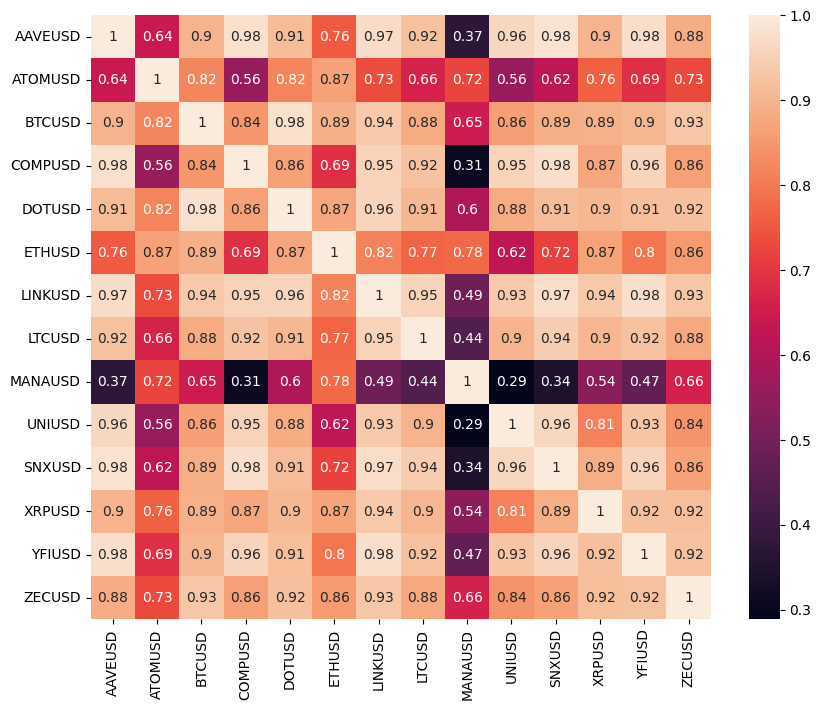

In [107]:
# Merging Close data for all pairs to figure correlation
all_pair_c = pd.DataFrame()
for i in range(len(pairs)):
    pair_c = pairs_df[i].loc[:,['Time','Close']]
    pair_c.rename(columns = {'Close':pairs[i]},inplace=True)
    if all_pair_c.empty:
        all_pair_c = pair_c
    else:
        all_pair_c = pd.merge(all_pair_c, pair_c, on = ['Time'])
        
corr_matrix = all_pair_c.corr(numeric_only=True)
figure(figsize=(10, 8), dpi=100)
fig = sn.heatmap(corr_matrix, annot = True).get_figure()
# A caveat here is that some pairs are missing data for some particular periods, thus merge will only do intersection
fig.savefig("plots/correlation_heatmap_output.png")

AAVE and COMP seem correlated! Let's work with those to figure long/short pairs strategy.

In [106]:
# Get close data for each pair and match length of data.
pair1 = 'AAVEUSD'
pair2 = 'YFIUSD'
coin1_df = pairs_df[pairs.index(pair1)]
coin2_df = pairs_df[pairs.index(pair2)]

if coin1_df.shape[0] < coin2_df.shape[0]:
    c = coin1_df.loc[:,['Time','Close']].merge(coin2_df.loc[:,['Time','Close']], on='Time', how='left').dropna()
    c.rename(columns={'Close_x':f'{pair1}','Close_y':f'{pair2}'},inplace=True)
    c.reset_index(inplace=True, drop=True)
    # print('case1')
else:
    c = coin2_df.loc[:,['Time','Close']].merge(coin1_df.loc[:,['Time','Close']], on='Time', how='left').dropna()
    c.rename(columns={'Close_x':f'{pair2}','Close_y':f'{pair1}'},inplace=True)
    c = c.iloc[:,[0,2,1]]
    c.reset_index(inplace=True, drop=True)

c1 = c[pair1] # close price of pair 1
c2 = c[pair2] # close price of pair 2


In [105]:
c.iloc[[0,-1],:]

,Time,AAVEUSD,YFIUSD
0,2021-02-21 00:00:00,443.92,42450.05
36934,2023-01-18 23:58:00,82.08,6554.79


In [104]:
# Pair Plot with Spread
fig = go.Figure()

scaling = 0.01  #scaling factor for visual purposes only

fig.add_trace(go.Scatter(
        name=f'{pair1}/USD',
        x=c.Time,y=(1/scaling)*c1,
        showlegend=True,
        mode='lines',line={'color': 'blue'}))

fig.add_trace(go.Scatter(
        name=f'{pair2}/USD',
        x=c.Time,y=c2,
        showlegend=True,
        mode='lines',line={'color': 'orange'}))

fig.add_trace(go.Scatter(
        name=f'Spread: {pair1} - {pair2}',
        x=c.Time,y= (1/scaling)*c1 - c2,
        mode='lines',line={'color': 'black'}))
        
fig.add_hline(y=0)

fig.update_layout(
                title={'text' : 'Close Prices of Pair','y':0.92,'x':0.5,'xanchor': 'center','yanchor': 'top'},
                xaxis_title="Time/Date",yaxis_title= 'USD', yaxis={'side': 'right'},xaxis = {'rangeslider': {'visible': False}},
                width = 900,height = 500)
fig.show()
fig.write_image(f'plots/Close_prices_of_pairs_scaled.png')

In [81]:
# Testing for cointegration
import statsmodels.tsa.stattools as ts 
 
#coin2_df has less rows than coin1_df, thus need left join
result = ts.coint(c.loc[:,f'{pair1}'], c.loc[:,f'{pair2}'])

# Cointegration test: A technique used to find a potential correlation in a time series (long term)
# Determines if the spread between the two assets are constant over time.
# Null Hypothesis: Spread between series are non-stationary.
# Uses the augmented Engle-Granger two-step cointegration test.   
cointegration_t_statistic = result[0]
p_val = result[1]
critical_values_test_statistic_at_1_5_10 = result[2]
print('We want the P val < 0.05 (meaning that cointegration exists)')
print('P value for the augmented Engle-Granger two-step cointegration test is', p_val)

We want the P val < 0.05 (meaning that cointegration exists)
P value for the augmented Engle-Granger two-step cointegration test is 1.096659136318698e-05


Since the p-value is less than critical value, we reject the null, our series is stationary, meaning we can potentially predict prices.

In [82]:
# Testing for stationary series
from statsmodels.tsa.stattools import adfuller
# Compute the ADF test for coin 1 and coin 2
# With all time series, you want to have stationary data otherwise our data will be very hard to predict.
# ADF for pair1
pair1_ADF = adfuller(c[pair1])
print('P value for the Augmented Dickey-Fuller Test is', pair1_ADF[1])

pair2_ADF = adfuller(c[pair2])
print('P value for the Augmented Dickey-Fuller Test is', pair2_ADF[1])

Spread_ADF = adfuller(c[pair1] - c[pair2])
print('P value for the Augmented Dickey-Fuller Test is', Spread_ADF[1])

Ratio_ADF = adfuller(c[pair1] / c[pair2])
print('P value for the Augmented Dickey-Fuller Test is', Ratio_ADF[1])

P value for the Augmented Dickey-Fuller Test is 0.19395206344584504
P value for the Augmented Dickey-Fuller Test is 0.312448443032585
P value for the Augmented Dickey-Fuller Test is 0.31148829127415234
P value for the Augmented Dickey-Fuller Test is 0.028114701420627997


Results: can claim stationary series for the ratio (since P value < 0.05). This suggests a constant ratio over time.
Therefore, the two series are cointegrated.

In [95]:
# Ratio Plot
ratio = np.array(c1/c2)
moving_ratio  = [ratio[0]]
for i in range(1,len(ratio)):
    moving_ratio.append(np.mean(ratio[0:i]))

fig = go.Figure()

fig.add_trace(go.Scatter(
        name=f'Ratio',
        x=c.Time,y= c1/c2,
        mode='lines',line={'color': 'green'}))

fig.add_trace(go.Scatter(
        name=f'Moving Ratio',
        x = c.Time,y = moving_ratio,
        mode='lines',line={'color': 'red'}))
        
fig.add_hline(name='Mean Ratio',y=(np.mean(c1/c2)),line_color='blue')
fig.add_hline(y=0,line_color='black')

fig.update_layout(
                title={'text' : f'Ratio of {pair1} to {pair2}','y':0.92,'x':0.5,'xanchor': 'center','yanchor': 'top'},
                xaxis_title="Time/Date",yaxis_title= f'{pair1}/{pair2}', yaxis={'side': 'right'},
                legend=dict(yanchor="top",y=1,xanchor="left",x=0),
                width = 1000,height = 600)
fig.show()
fig.write_image(f'plots/ratio_plot.png')

In [103]:
# Standardize with Z-Scores

ratio_z_score = (ratio - np.mean(ratio))/np.std(ratio)
fig = go.Figure()

fig.add_trace(go.Scatter(
        name = f'Ratio:{pair1}/{pair2}',
        x = c.Time,y = ratio_z_score,
        mode = 'lines',line = {'color': 'green'}))

fig.add_hline(y=np.mean(ratio_z_score),line_color='blue')

fig.add_hline(y=1,line_color='red')
fig.add_hline(y=-1,line_color='red')
fig.add_hline(y=2,line_color='red')
fig.add_hline(y=-2,line_color='red')

fig.update_layout(
                title={'text' : f'Z-Scores of Ratio of {pair1} to {pair2}','y':0.92,'x':0.5,'xanchor': 'center','yanchor': 'top'},
                xaxis_title="Time/Date",yaxis_title= 'Z-Score', yaxis={'side': 'right'},
                width = 800,height = 500)
fig.show()
fig.write_image(f'plots/ratio_z_scores.png')

If z-score >= 1: A:B ratio is 'too' high: thus short A, long B until z-score return to mean(0)
If z-score <= -1: A:B ratio is 'too' low: thus Long A, short B until z-score return to mean(0)

In [123]:
#Distribution of ratio Z-Scores

ratio_z_score = (ratio - np.mean(ratio))/np.std(ratio)
fig = go.Figure()

fig = px.histogram(ratio_z_score)
fig.add_vline(x=0,line_color='red')
fig.update_layout(
                title={'text' : f'Distribution of Z-Scores of Ratio of {pair1} to {pair2}','y':0.92,'x':0.5,'xanchor': 'center','yanchor': 'top'},
                xaxis_title="Time/Date",yaxis_title= 'Count', yaxis={'side': 'left'}, showlegend=False,
                width = 800,height = 500)

fig.show()

In [86]:
# PnL Calculator for trades
def buy_sell(c,e1,e2,lev=1,s=1):
    collateral = c
    entry = e1    #entry price
    exit = e2       #exit price
    leverage = lev      #leverage
    position = collateral*lev
    ls = s         # 1 if long, -1 if short
    pnl_frac  = np.round(ls*leverage*(exit - entry)/entry,3)
    pnl_val = np.round(collateral*pnl_frac,2)
    fee = 1 + 0.008  #0.8% open/close fee
    return pnl_val

In [97]:
# Simulation of Pairs-Trading Strategy
 
test_size = c.shape[0]
tdf = c.iloc[0:test_size,:].copy()
tdf.loc[:,'z_score'] = ratio_z_score[0:test_size]
collateral = 10000
cumm_pnl = 0
entry1 = False
entry2 = False
open_long_markers_A = {}
open_long_markers_B = {}
open_short_markers_A = {}
open_short_markers_B = {}
close_long_markers_A = {}
close_long_markers_B = {}
close_short_markers_A = {}
close_short_markers_B = {}
collat_over_time = {tdf.loc[0,'Time']:10000}
pnl_pair_A_plot = {}
pnl_pair_B_plot = {}

for i in range(tdf.shape[0]):
    row = tdf.loc[i,:]
    zs = tdf.loc[i,'z_score']
    
    if zs >= 1 and entry1 is False: # signal to short A /long B 
        t1 = tdf.loc[i,'Time']
        entry_price_A = tdf.loc[i,pair1] #open short A
        entry_price_B = tdf.loc[i,pair2] #open long B
        print(f'Date:{t1} \t\t OPEN {np.round(entry_price_A,2)} {pair1} SHORT \t\t OPEN {np.round(entry_price_B,2)} {pair2} LONG')
        open_short_markers_A[t1] = entry_price_A
        open_long_markers_B[t1] = entry_price_B
        entry1 = True
    elif zs <= 0.02 and zs >= -0.02 and entry1 is True:
        t2 = tdf.loc[i,'Time']
        exit_price_A = tdf.loc[i,pair1]
        exit_price_B = tdf.loc[i,pair2]
        pnl_trade_A = buy_sell(collateral/2, entry_price_A, exit_price_A, lev=1, s=-1) #close short A
        pnl_trade_B = buy_sell(collateral/2, entry_price_B, exit_price_B, lev=1, s=1) #close long B
        pnl_pair_A_plot[t2] = pnl_trade_A
        pnl_pair_B_plot[t2] = pnl_trade_B
        close_short_markers_A[t2] = exit_price_A
        close_long_markers_B[t2] = exit_price_B
        collateral += pnl_trade_A + pnl_trade_B
        collat_over_time[t2] = collateral
        cumm_pnl += pnl_trade_A + pnl_trade_B
        print(f'Date:{t2} \t\t CLOSE {np.round(exit_price_A,2)} {pair1} SHORT\t\t CLOSE {np.round(exit_price_B,2)} {pair2} LONG')
        print(f'\t\t\t\t\t SHORT PNL: {np.round(pnl_trade_A,2)} \t\t\t LONG PNL:{np.round(pnl_trade_B,2)}')
        print(f'Equity: {np.round(collateral,2)} \nCumm. PNL: {np.round(cumm_pnl,2)} \nTRADE PNL: {np.round(pnl_trade_A + pnl_trade_B,2)}')
        print('------------------------------------------------------------------------------------------------------------------------------------')
        entry1 = False

        if collateral <= 0:
            print('Need to fix....')

    if zs <= -2 and entry2 is False: # signal to long A / short B
        t1 = tdf.loc[i,'Time']
        entry_price_A = tdf.loc[i,pair1] # long A 
        entry_price_B = tdf.loc[i,pair2] # short B
        open_long_markers_A[t1] = entry_price_A
        open_short_markers_B[t1] = entry_price_B
        print(f'Date:{t1} \t\t OPEN {np.round(entry_price_A,2)} {pair1} LONG \t\t OPEN {np.round(entry_price_B,2)} {pair2} SHORT')
        entry2 = True
    elif zs <= 0.02 and zs >= -0.02 and entry2 is True:
        t2 = tdf.loc[i,'Time']
        exit_price_A = tdf.loc[i,pair1]
        exit_price_B = tdf.loc[i,pair2]
        pnl_trade_A = buy_sell(collateral/2, entry_price_A, exit_price_A, lev=1, s=1) #long A
        pnl_trade_B = buy_sell(collateral/2, entry_price_B, exit_price_B, lev=1, s=-1) #short B
        pnl_pair_A_plot[t2] = pnl_trade_A
        pnl_pair_B_plot[t2] = pnl_trade_B
        close_long_markers_A[t2] = exit_price_A
        close_short_markers_B[t2] = exit_price_B
        collateral += pnl_trade_A + pnl_trade_B
        collat_over_time[t2] = collateral
        cumm_pnl += pnl_trade_A + pnl_trade_B
        print(f'Date:{t2} \t\t CLOSE {np.round(exit_price_A,2)} {pair1} LONG \t\t CLOSE {np.round(exit_price_B,2)} {pair2} SHORT')
        print(f'\t\t\t\t\t LONG PNL: {np.round(pnl_trade_A,2)} \t\t\t SHORT PNL:{np.round(pnl_trade_B,2)}')
        print(f'Equity: {np.round(collateral,2)} \nCumm. PNL: {np.round(cumm_pnl,2)} \nTRADE PNL: {np.round(pnl_trade_A + pnl_trade_B,2)}')
        print('------------------------------------------------------------------------------------------------------------------------------------')
        entry2 = False

        if collateral <= 0:
            print('Need to fix....')

Date:2021-02-24 02:00:00 		 OPEN 391.11 AAVEUSD SHORT 		 OPEN 34550.0 YFIUSD LONG
Date:2021-04-06 15:30:00 		 CLOSE 386.73 AAVEUSD SHORT		 CLOSE 40627.8 YFIUSD LONG
					 SHORT PNL: 55.0 			 LONG PNL:880.0
Equity: 10935.0 
Cumm. PNL: 935.0 
TRADE PNL: 935.0
------------------------------------------------------------------------------------------------------------------------------------
Date:2021-05-11 14:00:00 		 OPEN 440.06 AAVEUSD LONG 		 OPEN 73170.93 YFIUSD SHORT
Date:2021-05-19 07:30:00 		 CLOSE 620.32 AAVEUSD LONG 		 CLOSE 65401.54 YFIUSD SHORT
					 LONG PNL: 2241.67 			 SHORT PNL:579.55
Equity: 13756.22 
Cumm. PNL: 3756.22 
TRADE PNL: 2821.22
------------------------------------------------------------------------------------------------------------------------------------
Date:2021-08-05 14:00:00 		 OPEN 376.89 AAVEUSD SHORT 		 OPEN 33359.72 YFIUSD LONG
Date:2021-09-04 16:30:00 		 CLOSE 400.38 AAVEUSD SHORT		 CLOSE 42234.91 YFIUSD LONG
					 SHORT PNL: -426.44 			 LONG PNL:1

In [98]:
# Pair A Trades Plot
fig = go.Figure()

fig.add_trace(go.Scatter(
        name=f'{pair1}',
        x=c.Time,y=c1,
        showlegend=True,
        mode='lines',line={'color': 'cyan'}))

fig.add_trace(go.Scatter(
        name=f'Open Long',
        x = list(open_long_markers_A.keys()),y = list(open_long_markers_A.values()),
        showlegend=True,
        mode='markers',marker=dict(symbol="arrow-right", line=dict(color="green"))))


fig.add_trace(go.Scatter(
        name=f'Close Long',
        x = list(close_long_markers_A.keys()),y = list(close_long_markers_A.values()),
        showlegend=True,
        mode='markers',marker=dict(symbol="arrow-left", line=dict(color="red"))))

fig.add_trace(go.Scatter(
        name=f'Open Short',
        x = list(open_short_markers_A.keys()),y = list(open_short_markers_A.values()),
        showlegend=True,
        mode='markers',marker=dict(symbol="circle-cross", line=dict(color="green"))))

fig.add_trace(go.Scatter(
        name=f'Close Short',
        x = list(close_short_markers_A.keys()),y = list(close_short_markers_A.values()),
        showlegend=True,
        mode='markers',marker=dict(symbol="circle-cross", line=dict(color="red"))))
        
        
fig.add_hline(y=0)

fig.update_layout(
                title={'text' : f'Open/Closes of {pair1} Trades','y':0.92,'x':0.5,'xanchor': 'center','yanchor': 'top'},
                xaxis_title="Time/Date",yaxis_title= f'{pair1}', yaxis={'side': 'right'},xaxis = {'rangeslider': {'visible': False}},
                width = 1200,height = 600)
fig.show()
# fig.write_image(f'plots/Open_Closes_of_{pair1}_Trades.png')

In [99]:
# Pair B Trades Plot
fig2 = go.Figure()

fig2.add_trace(go.Scatter(
        name=f'{pair2}',
        x=c.Time,y=c2,
        showlegend=True,
        mode='lines',line={'color': 'silver'}))

fig2.add_trace(go.Scatter(
        name=f'Open Long',
        x = list(open_long_markers_B.keys()),y = list(open_long_markers_B.values()),
        showlegend=True,
        mode='markers',marker=dict(symbol="arrow-right", line=dict(color="red"))))


fig2.add_trace(go.Scatter(
        name=f'Close Long',
        x = list(close_long_markers_B.keys()),y = list(close_long_markers_B.values()),
        showlegend=True,
        mode='markers',marker=dict(symbol="arrow-left", line=dict(color="green"))))

fig2.add_trace(go.Scatter(
        name=f'Open Short',
        x = list(open_short_markers_B.keys()),y = list(open_short_markers_B.values()),
        showlegend=True,
        mode='markers',marker=dict(symbol="circle-cross", line=dict(color="red"))))

fig2.add_trace(go.Scatter(
        name=f'Close Short',
        x = list(close_short_markers_B.keys()),y = list(close_short_markers_B.values()),
        showlegend=True,
        mode='markers',marker=dict(symbol="circle-cross", line=dict(color="green"))))
        
        
fig2.add_hline(y=0)

fig2.update_layout(
                title={'text' : f'Open/Closes of {pair2} Trades','y':0.92,'x':0.5,'xanchor': 'center','yanchor': 'top'},
                xaxis_title="Time/Date",yaxis_title= f'{pair2}', yaxis={'side': 'right'},xaxis = {'rangeslider': {'visible': False}},
                width = 1200,height = 600)

# fig2.write_image(f'plots/Open_Closes_of_{pair2}_Trades.png')

In [100]:
#PNL of Each Trade

fig = go.Figure()

fig.add_trace(go.Bar(
    x = list(pnl_pair_A_plot.keys()),y = list(pnl_pair_A_plot.values()),
    name = f'{pair1}',
    marker_color='purple'
))

fig.add_trace(go.Bar(
    x = list(pnl_pair_B_plot.keys()),y= list(pnl_pair_B_plot.values()),
    name = f'{pair2}',
    marker_color = 'blue'
))

fig.update_layout(
                barmode='group',title={'text' : f'PNL of each Pair Trade','y':0.92,'x':0.5,'xanchor': 'center','yanchor': 'top'},
                xaxis_title="Date",yaxis_title= f'PNL', yaxis={'side': 'left'},xaxis = {'rangeslider': {'visible': False}}, showlegend=True,
                width = 1000,height = 500)

fig.show()
fig.write_image("plots/PNL_of_each_trade.png")

In [102]:
# Collateral Over Time Plot

fig = go.Figure()

fig.add_trace(go.Scatter(
        name=f'Collateral Over Time',
        x = list(collat_over_time.keys()), y = list(collat_over_time.values()),
        mode='lines',line={'color': 'black'}))

fig.add_trace(go.Scatter(
        name=f'Collateral',
        x = list(collat_over_time.keys()),y = list(collat_over_time.values()),
        mode='markers',marker=dict(symbol="circle-cross", line=dict(color="green"))))

fig.update_layout(
                title={'text' : f'Change in Collateral Over Time','y':0.92,'x':0.5,'xanchor': 'center','yanchor': 'top'},
                xaxis_title="Time/Date",yaxis_title= f'Collateral', yaxis={'side': 'left'},xaxis = {'rangeslider': {'visible': False}}, showlegend=False,
                width = 600,height = 400)

# fig.write_image("plots/collateral_over_time.png")